# Trabalho Final

### Regras:

1. Pode ser feito individualmente ou em dupla (porém cada um deve colocar o código em um arquivio próprio);
2. O arquivo deve ser salvo como: "Trabalho_seunome.ipynb" e entregue na plataforma ou no e-mail: `profmatheus.pacheco@fiap.com.br`,
3. O Trabalho deve ser entregue no máximo até dia `17/04/2023`;
4. Escolhe apenas 1 dos 3 enunciados propostos.




# Enunciados

### Cadeia de Markov

Uma guarda de trânsito é designada para controlar o trâfego nos oito cruzametos da rua central. Ela é instruida a permanecer em cada cruzamento por uma hora e, em seguida, ou permanecer no mesmo cruzamento ou seguir para um cruzamento adjacente. Para evitar que ela estabeleça um padrão, ela deve escolher o novo cruzamento de maneira aleatória, com qualquer escolha igualmente provável. Por exemplo, se ela está no cruzamento 5, seu próximo cruzamento pode ser 2, 4, 5 ou 8, cada um com probabilidade de $\frac{1}{4}$. Cada dia ela começa no cruzamento em que parou no dia anterior. A matriz de transição desta cadeia de Markov é :

```py
import numpy as np 

C = np.array([[1/3, 1/3, 0  , 1/4, 0  , 0  , 0  , 0  ],
              [1/3, 1/3, 0  , 0  , 1/4, 0  , 0  , 0  ],
              [0  , 0  , 1/3, 0, 0  , 1/3, 0  , 0  ],
              [1/3, 0  , 1/3, 1/4, 1/4, 0  , 1/4, 0  ],
              [0  , 1/3, 0  , 1/4, 1/4, 0  , 0  , 1/2],
              [0  , 0  , 1/3, 0  , 0  , 1/3, 1/4, 0  ],
              [0  , 0  , 0  , 1/4, 0  , 1/3, 1/4, 0],
              [0  , 0  , 0  , 0  , 1/4, 0  , 1/4, 1/2]])

```

Através do método das Cadeias de Markov, calcule a tendência de probabilidade levando em conta os oitos cruzamentos


Obs: Você deve provar com 4 vetores-estado diferentes que eles convergem para o mesmo valor.

In [2]:
import numpy as np

# Matriz de transição para a cadeia de Markov
C = np.array([[1/3, 1/3, 0  , 1/4, 0  , 0  , 0  , 0  ],
              [1/3, 1/3, 0  , 0  , 1/4, 0  , 0  , 0  ],
              [0  , 0  , 1/3, 0, 0  , 1/3, 0  , 0  ],
              [1/3, 0  , 1/3, 1/4, 1/4, 0  , 1/4, 0  ],
              [0  , 1/3, 0  , 1/4, 1/4, 0  , 0  , 1/2],
              [0  , 0  , 1/3, 0  , 0  , 1/3, 1/4, 0  ],
              [0  , 0  , 0  , 1/4, 0  , 1/3, 1/4, 0],
              [0  , 0  , 0  , 0  , 1/4, 0  , 1/4, 1/2]])

# Vetores de estado inicial
estados_iniciais = [
    np.array([1, 0, 0, 0, 0, 0, 0, 0]),
    np.array([0, 1, 0, 0, 0, 0, 0, 0]),
    np.array([0, 0, 1, 0, 0, 0, 0, 0]),
    np.array([0, 0, 0, 1, 0, 0, 0, 0])
]

def get_estado_estavel(matriz, estado_inicial, iteracoes=100):
    estado = estado_inicial
    # Multiplica o vetor de estado pela matriz de transição em cada iteração
    for _ in range(iteracoes):
        estado = np.dot(estado, matriz)
    return estado

# Calcula o estado estável para cada vetor de estado inicial
estados_estaveis = [get_estado_estavel(C, estado) for estado in estados_iniciais]

# Imprime os estados estáveis para cada vetor de estado inicial
for i, estado in enumerate(estados_estaveis):
    print(f"Estado estável {i + 1}: {estado} \n\n")


Estado estável 1: [0.14599686 0.14599686 0.14599686 0.14599686 0.14599686 0.14599686
 0.14599686 0.14599686] 


Estado estável 2: [0.16012559 0.16012559 0.16012559 0.16012559 0.16012559 0.16012559
 0.16012559 0.16012559] 


Estado estável 3: [0.0188383 0.0188383 0.0188383 0.0188383 0.0188383 0.0188383 0.0188383
 0.0188383] 


Estado estável 4: [0.17582418 0.17582418 0.17582418 0.17582418 0.17582418 0.17582418
 0.17582418 0.17582418] 




### Método dos mínimos Quadrados

Encontre o polinômio cúbico utilizando o método de mínimos quadráticos, use os pontos $(-1,-10), (0,5), (1,6), (2,11) e (3,42)$.

Obs: Utilize a equação $$ax^{3}+bx^{2}+cx+d$$



Obs2: Plote os gráficos demonstrando a curva que melhor se ajusta aos pontos.

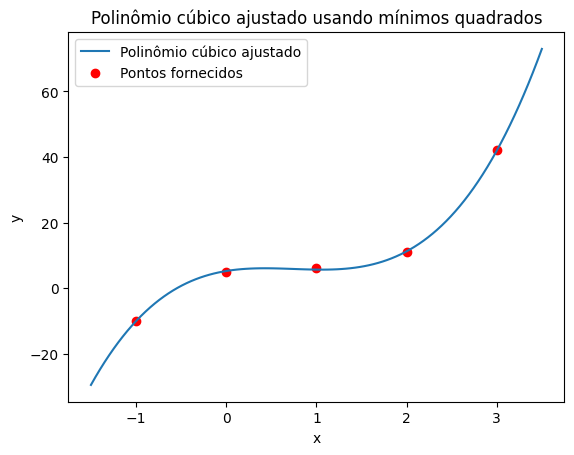

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# Definindo os pontos fornecidos
pontos = np.array([[-1, -10], [0, 5], [1, 6], [2, 11], [3, 42]])

# Criando a matriz X e o vetor y
X = np.array([[x**3, x**2, x, 1] for x in pontos[:, 0]])
y = pontos[:, 1]

# Resolvendo o sistema linear usando mínimos quadrados
coeficientes, _, _, _ = np.linalg.lstsq(X, y, rcond=None)
a, b, c, d = coeficientes

# Definindo a função do polinômio cúbico
def polinomio_cubico(x):
    return a * x**3 + b * x**2 + c * x + d

# Gerando pontos para plotar a curva do polinômio cúbico
x_valores = np.linspace(-1.5, 3.5, 100)
y_valores = polinomio_cubico(x_valores)

# Plotando o gráfico
plt.plot(x_valores, y_valores, label="Polinômio cúbico ajustado")
plt.scatter(pontos[:, 0], pontos[:, 1], color="red", label="Pontos fornecidos")
plt.legend()
plt.xlabel("x")
plt.ylabel("y")
plt.title("Polinômio cúbico ajustado usando mínimos quadrados")
plt.show()


### Manipulação de imagens

Escolha 5 fotos diferentes e faça os seguintes procedimentos:

1. Crie uma função que transforme uma imagem colorida em cinza;
2. Utilize o Kernel do efeito sépia para aplicar nas fotos escolhidas; 

```py

sepia = [0.272, 0.534, 0.131],
        [0.349, 0.686, 0.168],
        [0.393, 0.769, 0.189]
```
3. Escolha mais 3 kernels de feitos diferentes e aplique nas imagens;
4. Decomponha em camadas RGB todas as imagens. (utilize o slice ao invés de fazer por OpenCV)

In [23]:
import cv2
import numpy as np

# 1. Função para converter imagem colorida em cinza
def converter_para_cinza(imagem):
    imagem_cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)
    return imagem_cinza

# 2. Função para aplicar o efeito sépia
def aplicar_efeito_sepia(imagem):
    sepia_kernel = np.array([[0.272, 0.534, 0.131],
                             [0.349, 0.686, 0.168],
                             [0.393, 0.769, 0.189]])
    
    imagem_sepia = cv2.transform(imagem, sepia_kernel)
    return imagem_sepia

# 3. Função para aplicar outros 3 kernels de efeitos diferentes
def aplicar_outros_efeitos(imagem, kernel):
    imagem_efeito = cv2.filter2D(imagem, -1, kernel)
    return imagem_efeito

# 4. Função para decompor as camadas RGB
def decompor_camadas_rgb(imagem):
    camada_r = imagem[:, :, 0]
    camada_g = imagem[:, :, 1]
    camada_b = imagem[:, :, 2]
    return camada_r, camada_g, camada_b

# Exemplo de kernels para serem usados na função 'aplicar_outros_efeitos'
sharpen_kernel = np.array([[-1, -1, -1],
                           [-1, 9, -1],
                           [-1, -1, -1]])

emboss_kernel = np.array([[-2, -1, 0],
                          [-1, 1, 1],
                          [0, 1, 2]])

outline_kernel = np.array([[-1, -1, -1],
                           [-1, 8, -1],
                           [-1, -1, -1]])

In [11]:
def processar_imagens(lista_caminhos_imagens):
    for caminho in lista_caminhos_imagens:
        imagem = cv2.imread(caminho)

        # Aplicar funções na imagem
        imagem_cinza = converter_para_cinza(imagem)
        imagem_sepia = aplicar_efeito_sepia(imagem)
        imagem_sharpen = aplicar_outros_efeitos(imagem, sharpen_kernel)
        imagem_emboss = aplicar_outros_efeitos(imagem, emboss_kernel)
        imagem_outline = aplicar_outros_efeitos(imagem, outline_kernel)

        # Decompor camadas RGB
        imagem_r, imagem_g, imagem_b = decompor_camadas_rgb(imagem)

        # Salvar imagens processadas (opcional)
        base_nome_arquivo = caminho.split('/')[-1].split('.')[0]
        cv2.imwrite(f"{base_nome_arquivo}_cinza.jpg", imagem_cinza)
        cv2.imwrite(f"{base_nome_arquivo}_sepia.jpg", imagem_sepia)
        cv2.imwrite(f"{base_nome_arquivo}_sharpen.jpg", imagem_sharpen)
        cv2.imwrite(f"{base_nome_arquivo}_emboss.jpg", imagem_emboss)
        cv2.imwrite(f"{base_nome_arquivo}_outline.jpg", imagem_outline)

caminhos_imagens = ["image1.jpg",
                    "image2.jpg",
                    "image3.jpg",
                    "image4.jpg",
                    "image5.jpg"]

processar_imagens(caminhos_imagens)


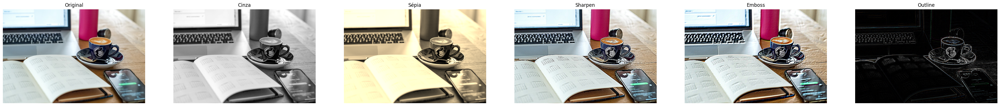

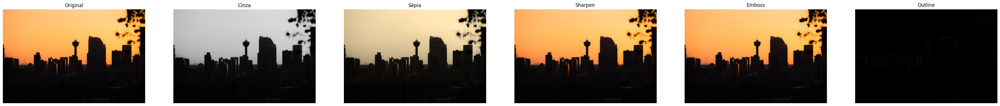

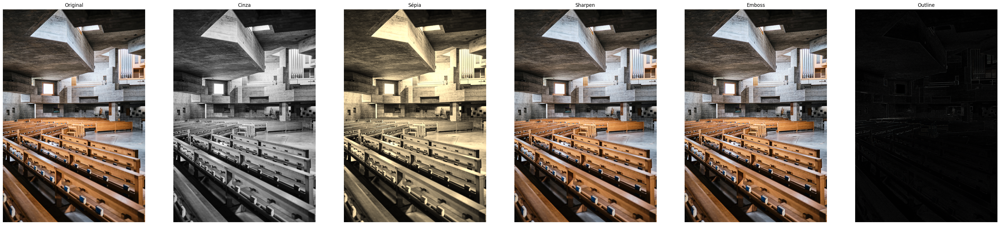

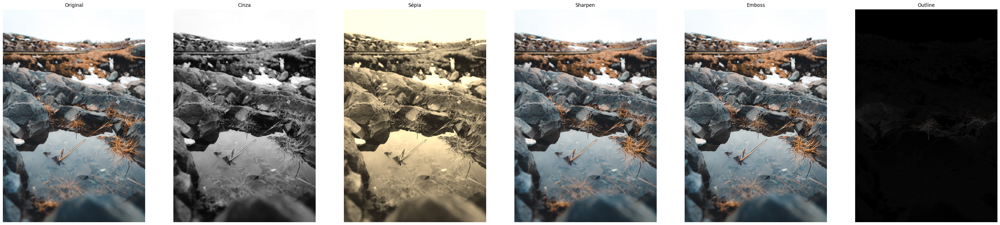

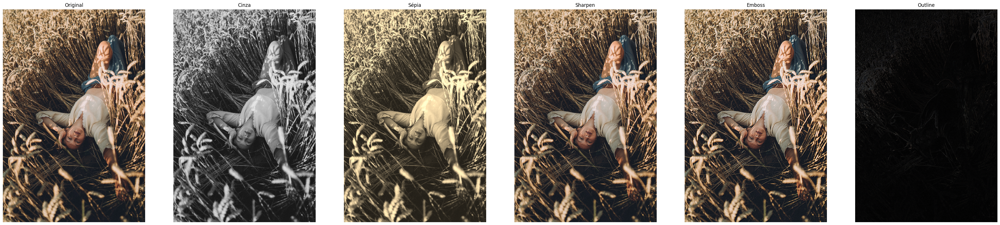

In [24]:
import matplotlib.pyplot as plt

def exibir_imagens(imagem, imagem_cinza, imagem_sepia, imagem_sharpen, imagem_emboss, imagem_outline):
    fig, axs = plt.subplots(1, 6, figsize=(45, 15))
    
    axs[0].imshow(cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB))
    axs[0].set_title('Original')
    axs[0].axis('off')

    axs[1].imshow(imagem_cinza, cmap='gray')
    axs[1].set_title('Cinza')
    axs[1].axis('off')

    axs[2].imshow(cv2.cvtColor(imagem_sepia, cv2.COLOR_BGR2RGB))
    axs[2].set_title('Sépia')
    axs[2].axis('off')

    axs[3].imshow(cv2.cvtColor(imagem_sharpen, cv2.COLOR_BGR2RGB))
    axs[3].set_title('Sharpen')
    axs[3].axis('off')

    axs[4].imshow(cv2.cvtColor(imagem_emboss, cv2.COLOR_BGR2RGB))
    axs[4].set_title('Emboss')
    axs[4].axis('off')

    axs[5].imshow(cv2.cvtColor(imagem_outline, cv2.COLOR_BGR2RGB))
    axs[5].set_title('Outline')
    axs[5].axis('off')

    plt.show()

def processar_imagens_e_exibir(lista_caminhos_imagens):
    for caminho in lista_caminhos_imagens:
        imagem = cv2.imread(caminho)

        # Aplicar funções na imagem
        imagem_cinza = converter_para_cinza(imagem)
        imagem_sepia = aplicar_efeito_sepia(imagem)
        imagem_sharpen = aplicar_outros_efeitos(imagem, sharpen_kernel)
        imagem_emboss = aplicar_outros_efeitos(imagem, emboss_kernel)
        imagem_outline = aplicar_outros_efeitos(imagem, outline_kernel)

        # Exibir imagens
        exibir_imagens(imagem, imagem_cinza, imagem_sepia, imagem_sharpen, imagem_emboss, imagem_outline)

caminhos_imagens = ["image1.jpg",
                    "image2.jpg",
                    "image3.jpg",
                    "image4.jpg",
                    "image5.jpg"]

processar_imagens_e_exibir(caminhos_imagens)